# **XAI for Skin Cancer Classification**
### *via B-cosification*

**Authors:** Tommaso Federici & Lucia Fornetti

---

## **Abstract & Motivation**
Deep Learning has revolutionized medical imaging, achieving superhuman accuracy in diagnostic tasks. However, the clinical adoption of these models is often hindered by the **"Black Box" problem**: standard neural networks are opaque, making their decisions difficult for medical professionals to trust and verify.

In this project, we explore **Explainable AI (XAI)** applied to **Skin Cancer Classification**. Rather than relying solely on post-hoc explanation methods (i.e. Grad-CAM), we implement the **B-cosification** technique. This approach transforms standard neural networks into *inherently interpretable* models, aligning the model's decision-making process with human-understandable visual evidence.

### **The Challenge: The "Black Box" in Medicine**
Medical professionals cannot blindly trust the output of an AI model, regardless of its statistical accuracy. Standard Convolutional Neural Networks (CNNs) operate as **"Black Boxes"**: while they achieve state-of-the-art performance, they fail to provide explanations that are both **faithful** (truly reflecting the model's reasoning) and **interpretable** (visually understandable by humans).

* **The Goal:** To design a **White-Box** model that matches the high classification performance of standard baselines while providing explanations that are **inherently faithful** to the decision process and **easily interpretable** by dermatologists.

### **Project Objectives**
We compare two approaches using the **HAM10000** dataset (7 diagnostic categories):

1.  **Baseline Model (ResNet50):** A standard deep learning backbone optimized for pure classification performance.
2.  **B-cos Model (B-cosification):** A modified ResNet50 that replaces linear transformations with B-cos operators, enforcing high interpretability without significant loss in accuracy.

We evaluate both models on:
* **Quantitative Metrics:** Accuracy, F1-Score (Macro), AUC, ...
* **Qualitative Analysis:** Visual comparison between **Grad-CAM** (Standard) and **B-cos Explanations** (Intrinsic) to validate if the model focuses on clinically relevant features (e.g., irregular borders, pigment network).

In [2]:
# =============================================================================
# 1. ENVIRONMENT SETUP & IMPORTS
# =============================================================================
import os
import sys
import random
import copy
import types
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torch.optim.lr_scheduler import OneCycleLR
from torch.cuda.amp import autocast, GradScaler # Mixed Precision
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from PIL import Image
from glob import glob

# Clone & Setup B-cosification
if not os.path.exists('B-cosification'):
    print("Cloning B-cosification repository...")
    !git clone https://github.com/shrebox/B-cosification.git
    # Fix folder structure to prevent internal import errors
    !mv B-cosification/bcos/experiments/ImageNet/bcosification B-cosification/bcos/experiments/ImageNet/bcos_final
    !pip install -q ftfy regex tqdm matplotlib

sys.path.append('./B-cosification')
try:
    from bcosify import BcosifyNetwork
    print("B-cosification imported successfully.")
except ImportError:
    print("Error importing B-cosification.")

# Hardware Configuration
print("Checking GPU...")
if torch.cuda.is_available():
    print(f"✅ GPU Detected: {torch.cuda.get_device_name(0)}")
    device = torch.device("cuda")
    PIN_MEMORY = True 
    BATCH_SIZE = 32 # Optimized for T4 with AMP
else:
    print("❌ WARNING: CPU Mode.")
    device = torch.device("cpu")
    PIN_MEMORY = False
    BATCH_SIZE = 8

# Seeding for reproducibility
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    print(f"Seed set for reproducibility: {seed}")

SEED = 42
seed_everything(SEED)

B-cosification imported successfully.
Checking GPU...
✅ GPU Detected: Tesla P100-PCIE-16GB
Seed set for reproducibility: 42


## **Data Pipeline & Preprocessing**

In this section, we set up the data loading and transformation pipeline. Key components include:

* **Custom B-cos Transformation (`AddInverse`):** B-cosified models require input features to be positive. To achieve this while preserving information, we concatenate the original RGB image ($x$) with its inverse ($1-x$). This results in a **6-channel input** (RGB + Inverted RGB) rather than the standard 3.
* **Data Augmentation:** We apply standard augmentations (Random Flip, Rotation, Color Jitter) to improve generalization.
* **Stratified Split (80/10/10):** The dataset is split into **Train**, **Validation**, and **Test** sets while preserving the original class distribution.
* **Imbalance Handling:** Since HAM10000 is highly imbalanced (e.g., thousands of Nevi vs. few Dermatofibromas), we implement a **`WeightedRandomSampler`**. This ensures that rare classes are sampled more frequently during training, preventing the model from becoming biased toward the majority class.

In [3]:
# =============================================================================
# 2. DATA PIPELINE (DATASET & TRANSFORMS)
# =============================================================================

class AddInverse(nn.Module):
    """Adds inverse channels (1-x) for B-cosification (RGB -> 6 channels)."""
    def forward(self, img):
        return torch.cat([img, 1.0 - img], dim=-3)

class HAM10000Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path']).convert("RGB")
        if self.transform: img = self.transform(img)
        return img, row['label_idx']

def get_transforms(mode='standard'):
    """Returns appropriate transformations based on the mode."""
    common_aug = [
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(20),
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
    ]
    
    base_val = [transforms.Resize((224, 224)), transforms.ToTensor()]
    
    if mode == 'standard':
        # Standard ImageNet normalization
        norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        train_tf = transforms.Compose(common_aug + [transforms.ToTensor(), norm])
        val_tf = transforms.Compose(base_val + [norm])
        
    elif mode == 'bcos':
        # AddInverse for 6 channels
        train_tf = transforms.Compose(common_aug + [transforms.ToTensor(), AddInverse()])
        val_tf = transforms.Compose(base_val + [AddInverse()])
        
    return train_tf, val_tf

def prepare_data(data_dir, seed=42):
    """
    Loads CSV and creates 80/10/10 splits (Train/Val/Test).
    Returns Train, Val, Test and the Sampler for Train.
    """
    print("- Loading Metadata and Splitting (Train/Val/Test)...")
    all_image_paths = glob(os.path.join(data_dir, '*', '*.jpg'))
    id_path_dict = {os.path.splitext(os.path.basename(x))[0]: x for x in all_image_paths}
    
    df = pd.read_csv(os.path.join(data_dir, 'HAM10000_metadata.csv'))
    df['path'] = df['image_id'].map(id_path_dict)
    
    labels = sorted(df['dx'].unique())
    label_map = {label: i for i, label in enumerate(labels)}
    df['label_idx'] = df['dx'].map(label_map)
    
    # --- SPLIT (80% Train, 10% Val, 10% Test) ---
    train_df, temp_df = train_test_split(df, test_size=0.2, stratify=df['label_idx'], random_state=seed)
    
    val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label_idx'], random_state=seed)
    
    # Weighted Sampler (Train only)
    class_counts = train_df['label_idx'].value_counts().sort_index()
    weights = 1. / class_counts
    samples_weights = torch.tensor([weights[l] for l in train_df['label_idx']])
    sampler = WeightedRandomSampler(samples_weights, len(samples_weights), generator=torch.Generator().manual_seed(seed))
    
    return train_df, val_df, test_df, sampler, len(labels)

# Data Loading Execution
DATA_DIR = '/kaggle/input/skin-cancer-mnist-ham10000'
if not os.path.exists(DATA_DIR): DATA_DIR = 'skin-cancer-mnist-ham10000'

train_df, val_df, test_df, train_sampler, NUM_CLASSES = prepare_data(DATA_DIR, SEED)
print(f"   Data ready: {len(train_df)} Train, {len(val_df)} Val, {len(test_df)} Test. Classes: {NUM_CLASSES}")

- Loading Metadata and Splitting (Train/Val/Test)...
   Data ready: 8012 Train, 1001 Val, 1002 Test. Classes: 7


## **Model Factory: Architecture & B-cosification**

This section defines the unified factory function `get_model`, which instantiates two variations of the **ResNet-50** architecture:

1.  **Standard Baseline (`mode='standard'`):**
    * Initializes a standard ResNet-50 pre-trained on **ImageNet**.
    * The final fully connected layer is modified to output `NUM_CLASSES` (7 for HAM10000).
    * This serves as our "Black Box" reference for performance comparison.

2.  **B-cosified Model (`mode='bcos'`):**
    * **Initialization:** Instead of starting from scratch or generic ImageNet weights, we load the weights from our *trained Standard Baseline*. This strategy significantly stabilizes the training of B-cos networks.
    * **Conversion:** We use the `BcosifyNetwork` wrapper to replace standard linear layers with **B-cos operators**.
    * **Hyperparameters:**
        * `B=2.0`: The most important hyperparameter for the B-cos transformation, forces the model to prioritize directional alignment between weights and inputs ('Alignment Pressure').
        * `add_channels=True`: Automatically adapts the first layer to accept the 6-channel input (RGB + Inverse).
        * `act_layer=True`: We mantain the ReLU as non-linearity, standard decision for b-cosification.

> **Technical Note: Monkey Patching**
> We implement a custom forward pass (`bcos_resnet_forward_patch`). Standard ResNets flatten feature maps before the final classification. In B-cos networks, to generate pixel-perfect heatmaps, we must preserve spatial dimensions until the very last moment. This patch replaces the standard flattening with a **Global Average Pooling (GAP)** on the convolutional output, ensuring the interpretability of the final layer.

In [4]:
# =============================================================================
# 3. MODEL FACTORY
# =============================================================================

def bcos_resnet_forward_patch(self, x):
    """Monkey Patch for the B-cosified ResNet forward pass (avoids premature flattening)."""
    x = self.conv1(x); x = self.bn1(x); x = self.relu(x); x = self.maxpool(x)
    x = self.layer1(x); x = self.layer2(x); x = self.layer3(x); x = self.layer4(x)
    # Conv2d Head -> Global Average Pooling
    return self.fc(x).mean(dim=(2, 3))

def get_model(mode, num_classes, baseline_weights_path=None, device='cuda'):
    print(f"Building Model: {mode.upper()}")
    
    # Base: Standard ResNet50
    # Use ImageNet weights for standard mode
    base_weights = 'IMAGENET1K_V1' if mode == 'standard' else None
    model = models.resnet50(weights=base_weights)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    
    if mode == 'standard':
        return model.to(device)
    
    elif mode == 'bcos':
        if baseline_weights_path and os.path.exists(baseline_weights_path):
            print(f"   Loading Baseline weights from: {baseline_weights_path}")
            model.load_state_dict(torch.load(baseline_weights_path, map_location='cpu'))
        else:
            print("WARNING: Baseline weights not found!")

        bcos_config = {
            "bcosify_args": {
                "gap": True, "act_layer": True, "norm_layer": "BnUncV2", "clip_kd": False
            },
            "bcos_args": { 
                "b": 2.0, "scale": 1.0
            },
            "last_layer_name": "fc"
        }
        
        print("   Converting to B-cos network...")
        model_bcos = BcosifyNetwork(model, bcos_config, add_channels=True)
        
        model_bcos.model._forward_impl = types.MethodType(bcos_resnet_forward_patch, model_bcos.model)
        
        return model_bcos.to(device)

## **Unified Training Engine**

To ensure a fair comparison, we implement a single, robust training pipeline used for both the Standard and B-cosified models. This function abstracts the training complexity and incorporates several best practices:

* **Automatic Mixed Precision (AMP):** We utilize `torch.amp.GradScaler` to train in `float16` where possible. This significantly reduces memory usage and speeds up training on modern GPUs (like the T4) without losing convergence stability.
* **OneCycleLR Policy:** We use the One Cycle Learning Rate scheduler, which warms up the learning rate to a maximum value and then decays it. This technique typically leads to faster super-convergence.
* **Imbalance Handling:**
    * **Sampler:** The training loader uses the `WeightedRandomSampler` defined in the data pipeline to oversample rare classes.
    * **Metric:** We optimize for **Macro F1-Score** (not just Accuracy) to ensure the model performs well on minority classes like *Dermatofibroma* or *Vascular Lesions*.
* **Early Stopping:** Training automatically halts if the Macro F1-Score on the validation set does not improve for `patience` epochs, saving the best checkpoint.

In [5]:
# =============================================================================
# 4. UNIFIED TRAINING ENGINE
# =============================================================================

def run_training_pipeline(model, mode, epochs, max_lr, save_name='model_best.pth', patience=15):
    print("\n" + "="*60)
    print(f"STARTING TRAINING PIPELINE: {mode.upper()}")
    print(f"   Epochs: {epochs} | Max LR: {max_lr} | Batch: {BATCH_SIZE}")
    print("="*60)
    
    # 1. Prepare DataLoaders
    print("   Generating DataLoaders...")
    train_tf, val_tf = get_transforms(mode)
    
    train_ds = HAM10000Dataset(train_df, transform=train_tf)
    val_ds = HAM10000Dataset(val_df, transform=val_tf)
    
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=train_sampler, num_workers=2, pin_memory=PIN_MEMORY)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=PIN_MEMORY)
    
    model = model.to(device)
    
    # 2. Setup Optimizer, Scheduler & Loss
    optimizer = optim.AdamW(model.parameters(), lr=max_lr, weight_decay=1e-2 if mode=='standard' else 1e-4)
    scheduler = OneCycleLR(optimizer, max_lr=max_lr, epochs=epochs, steps_per_epoch=len(train_loader), pct_start=0.3)
    
    criterion = nn.CrossEntropyLoss(label_smoothing=0.1 if mode=='standard' else 0.0)
    scaler = torch.amp.GradScaler('cuda') # AMP for speed
    
    # 3. Training Loop
    best_f1 = 0.0
    patience_counter = 0
    print(f" Starting Loop...")
    
    for epoch in range(epochs):
        # --- TRAIN ---
        model.train()
        running_loss = 0.0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            optimizer.zero_grad()
            
            with torch.amp.autocast('cuda'):
                outputs = model(inputs)
                loss = criterion(outputs, labels)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
            
            running_loss += loss.item() * inputs.size(0)
            
        # --- VALIDATION ---
        model.eval()
        all_preds, all_labels = [], []
        val_loss = 0.0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
        
        # --- METRICS ---
        epoch_loss = val_loss / len(val_ds)
        epoch_f1 = f1_score(all_labels, all_preds, average='macro')
        
        print(f"Ep {epoch+1:02d}/{epochs} | Loss: {epoch_loss:.4f} | F1: {epoch_f1:.4f}")
        
        # Save Best
        if epoch_f1 > best_f1:
            best_f1 = epoch_f1
            torch.save(model.state_dict(), save_name)
            patience_counter = 0
        else:
            patience_counter += 1
            print(f" ⏳ ({patience_counter}/{patience})")

        if patience_counter >= patience:
            print(f"\n EARLY STOPPING TRIGGERED: No F1 improvement for {patience} epochs.")
            break
            
    print(f"--- Training Finished. Best F1: {best_f1:.4f}. Saved to: {save_name}")
    return save_name

## **Main Execution: Two-Stage Training**

The experiment is conducted in two sequential phases using a **Full Fine-Tuning** strategy (all layers unfrozen) in both steps.

1.  **Step A: Baseline Training (Standard ResNet)**
    * **Goal:** To establish a high-accuracy "Black Box" benchmark.
    * **Strategy:** We initialize with ImageNet weights but train **all layers**. Full fine-tuning is necessary here to bridge the significant **domain shift** between natural images (ImageNet) and specific dermatoscopic features (HAM10000).

2.  **Step B: B-cosification & Fine-tuning**
    * **Warm-Start Strategy:** We initialize the B-cos model with the best weights from Step A to stabilize convergence.
    * **Strategy:** Despite the warm start, we perform **Full Fine-Tuning** again (with a lower learning rate of `1e-4`). This is critical to **re-align the weights**: the structural conversion to B-cos operators changes the layer statistics, and the network needs to adjust all its parameters to settle into the new, interpretable manifold.

In [ ]:
# =============================================================================
# 5. TRAINING EXECUTION
# =============================================================================

# --- STEP A: Train Baseline (Standard ResNet) ---
baseline_model = get_model(mode='standard', num_classes=NUM_CLASSES)
baseline_path = run_training_pipeline(
    model=baseline_model,
    mode='standard', 
    epochs=30, 
    max_lr=1e-3, 
    save_name='resnet_standard_best.pth',
    patience= 10
)

# --- STEP B: B-cosification + fine-tuning (B-cos ResNet) ---
bcos_model = get_model(
    mode='bcos', 
    num_classes=NUM_CLASSES, 
    baseline_weights_path=baseline_path
)
bcos_path = run_training_pipeline(
    mode='bcos', 
    epochs=50, 
    max_lr=1e-4, 
    save_name='resnet_bcos_best.pth',
    patience=15
)

# **Evaluation**
---
## **Strategy & Metrics**

To rigorously assess the performance of our models, we adopt the evaluation protocols established by the **ISIC 2018 Challenge (Task 3: Lesion Diagnosis)**. Given the high class imbalance of the HAM10000 dataset (where *Melanocytic Nevi* dominate), standard accuracy is an insufficient metric.

We employ a multi-faceted evaluation strategy focusing on three key pillars:

1.  **Clinical Safety (Sensitivity):** In dermatology, a False Negative (missing a melanoma) is far worse than a False Positive. We prioritize high **Recall (Sensitivity)** on malignant classes.
2.  **Class-Imbalance Robustness:** We utilize **Macro-Averaged** metrics (F1-Score, AUC) which treat all classes equally, preventing the majority class from masking poor performance on rare lesions (like *Dermatofibroma*).
3.  **Explainability (Qualitative):** Beyond numbers, we evaluate the **faithfulness** of the model's focus using heatmaps.

#### **Selected Metrics (ISIC 2018 Compliant):**
* **Balanced Accuracy:** The arithmetic mean of sensitivity and specificity. This was the primary ranking metric for the ISIC 2018 challenge.
* **Macro F1-Score:** The harmonic mean of Precision and Recall, computed per class and averaged.
* **AUC (One-vs-Rest):** Measures the model's ability to distinguish between classes across all decision thresholds.
* **Specificity & NPV:** To ensure benign lesions are correctly identified, reducing unnecessary biopsies.

In [7]:
# =============================================================================
# 6. EVALUATION IMPORTS & SETUP
# =============================================================================
from sklearn.preprocessing import label_binarize
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import cv2
import random
from torchvision import transforms
import seaborn as sns
import pandas as pd
from sklearn.metrics import (
    confusion_matrix, classification_report, accuracy_score, 
    balanced_accuracy_score, precision_recall_fscore_support, 
    average_precision_score, roc_auc_score, roc_curve, auc
)


std_path = '/kaggle/input/final-model-weights/resnet_standard_best.pth'
bcos_path = '/kaggle/input/final-model-weights/resnet_bcos_best.pth'

print(f" Test Dataset: {len(test_df)} images")

# --- A. Load Standard Model ---
print(f" Loading Standard Model from: {std_path}")
model_std = get_model('standard', NUM_CLASSES, device=device)
model_std.load_state_dict(torch.load(std_path, map_location=device))
model_std.eval()

# Standard Dataset (Test Set)
_, val_tf_std = get_transforms('standard')
test_ds_std = HAM10000Dataset(test_df, transform=val_tf_std)

# --- B. Load B-cos Model ---
print(f" Loading B-cos Model from: {bcos_path}")
model_bcos = get_model('bcos', NUM_CLASSES, baseline_weights_path=None, device=device)
model_bcos.load_state_dict(torch.load(bcos_path, map_location=device))
model_bcos.eval()

# B-cos Dataset (Test Set)
_, val_tf_bcos = get_transforms('bcos')
test_ds_bcos = HAM10000Dataset(test_df, transform=val_tf_bcos)

 Test Dataset: 1002 images
 Loading Standard Model from: /kaggle/input/final-model-weights/resnet_standard_best.pth
Building Model: STANDARD
 Loading B-cos Model from: /kaggle/input/final-model-weights/resnet_bcos_best.pth
Building Model: BCOS
   Converting to B-cos network...
Last Linear Layer Bcosified (Conv1x1) with GAP


In [8]:
# =============================================================================
# 7. FULL EVALUATION DEFINITION
# =============================================================================

# Inference Function
def get_preds_and_probs(model, dataset, device='cuda'):
    loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)
    all_labels, all_preds, all_probs = [], [], []
    model.eval()
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy()) # .cpu() added for safety
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)


# =============================================================================
# CONFUSION MATRIX VISUALIZATION
# =============================================================================
def plot_comparison_matrices(y_true1, y_pred1, y_true2, y_pred2, classes):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    
    # Standard
    cm_std = confusion_matrix(y_true1, y_pred1)
    sns.heatmap(cm_std, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=classes, yticklabels=classes, ax=axes[0])
    axes[0].set_title(f"STANDARD MODEL\nAcc: {accuracy_score(y_true1, y_pred1):.2%}", fontsize=14, fontweight='bold', color='darkblue')
    axes[0].set_ylabel('True Label')
    axes[0].set_xlabel('Predicted Label')

    # B-cos
    cm_bcos = confusion_matrix(y_true2, y_pred2)
    sns.heatmap(cm_bcos, annot=True, fmt='d', cmap='Greens', cbar=False,
                xticklabels=classes, yticklabels=classes, ax=axes[1])
    axes[1].set_title(f"B-COSIFIED\nAcc: {accuracy_score(y_true2, y_pred2):.2%}", fontsize=14, fontweight='bold', color='darkgreen')
    axes[1].set_ylabel('True Label')
    axes[1].set_xlabel('Predicted Label')
    
    plt.suptitle("Comparison of Confusion Matrices (Test Set)", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()


# =============================================================================
# ADVANCED METRICS CALCULATION
# =============================================================================
def compute_metrics_dict_advanced(y_true, y_pred, y_probs, model_name, classes):
    # --- 1. Basic Calculations ---
    cm = confusion_matrix(y_true, y_pred)
    
    # Calculate NPV and Specificity per class (Manual Macro Average)
    specificities = []
    npvs = []
    
    for i in range(len(cm)):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        fn = cm[i, :].sum() - cm[i, i]
        
        # Specificity
        denom_spec = tn + fp
        spec = tn / denom_spec if denom_spec > 0 else 0
        specificities.append(spec)
        
        # NPV (Negative Predictive Value)
        denom_npv = tn + fn
        npv = tn / denom_npv if denom_npv > 0 else 0
        npvs.append(npv)

    macro_spec = np.mean(specificities)
    macro_npv = np.mean(npvs)
    
    prec_macro, rec_macro, f1_macro, _ = precision_recall_fscore_support(y_true, y_pred, average='macro', zero_division=0)
    
    # MAP and AUC
    y_true_bin = label_binarize(y_true, classes=range(len(classes)))
    map_score = average_precision_score(y_true_bin, y_probs, average="macro")
    auc_score = roc_auc_score(y_true, y_probs, multi_class='ovr', average='macro')

    return {
        "Model": model_name,
        "Accuracy": accuracy_score(y_true, y_pred),
        "Sensitivity (Recall)": rec_macro, 
        "Specificity": macro_spec,
        "PPV (Precision)": prec_macro,
        "NPV": macro_npv,
        "F1-Score (Macro)": f1_macro,
        "MAP": map_score,
        "Mean AUC (OvR)": auc_score
    }

def get_binary_analysis(y_true, y_probs, model_name):
    # "Malignant" Probability = sum of probabilities of malignant classes
    prob_malignant = np.sum(y_probs[:, malignant_idxs], axis=1)
    
    # True binary label (1 if index is in malignant_idxs)
    y_true_binary = np.isin(y_true, malignant_idxs).astype(int)
    
    # --- Calculate AUC Malignant vs Benign ---
    auc_bin = roc_auc_score(y_true_binary, prob_malignant)
    
    # --- Calculate AUC80 (Partial AUC with Sensitivity >= 0.8) ---
    fpr, tpr, thresholds = roc_curve(y_true_binary, prob_malignant)
    
    mask = tpr >= 0.80
    if np.sum(mask) > 1:
        p_auc = auc(fpr[mask], tpr[mask])
    else:
        p_auc = 0.0

    print(f"--- {model_name} Binary Analysis ---")
    print(f"AUC Malignant vs Benign: {auc_bin:.4f}")
    print(f"AUC80 (High Sensitivity region): {p_auc:.4f}")
    
    return auc_bin, p_auc

## **Results Analysis: Comprehensive Comparison**

The table below presents the full performance breakdown on the unseen Test Set. It compares the **Standard "Black Box" Baseline** against the **B-cosified "Glass Box" Model** across all computed metrics.

| Metric Category | Metric | Standard Model | B-cos Model |
| :--- | :--- | :---: | :---: |
| **Overall** | **Accuracy** | 85.63% | 80.24% |
| | **Macro F1-Score** | 77.52% | 72.78% |
| | **MAP (Mean Avg Precision)** | 86.20% | 76.15% |
| **Clinical** | **Sensitivity (Recall)** | 77.33% | 74.14% |
| | **Specificity** | 96.45% | 95.60% |
| | **PPV (Precision)** | 78.39% | 72.82% |
| | **NPV (Neg. Pred. Value)** | 96.34% | 94.85% |
| **Probabilistic** | **Mean AUC (OvR)** | 96.62% | 95.26% |
| | **Binary AUC (Mal vs Ben)** | 0.9427 | 0.9215 |
| | **pAUC (Sensitivity ≥ 80%)** | 0.8926 | 0.8331 |

#### **Discussion: The Price of Interpretability**
The results quantify the trade-off between performance and transparency:

1.  **Consistent Drop:** The B-cosified model shows a systematic decrease in performance across all metrics (approx. **-5%** in Accuracy and F1). This confirms that constraining the neural network to be *inherently interpretable* (forcing linearity) limits its ability to learn complex, non-linear features that the Standard model exploits.
2.  **Safety Profile:** Despite the drop, the **B-cos model remains robust**:
    * **NPV is high (~95%)**, meaning it rarely misses a negative case.
    * **Specificity is comparable (~96%)**, meaning it handles benign lesions almost as well as the baseline.
3.  **Conclusion:** While the Standard model is the better pure classifier, the B-cos model offers a **"Glass Box" alternative** with respectable performance (>0.92 Binary AUC), making it a viable candidate for scenarios where trust and verification are prioritized over raw accuracy.

1/2 Analyzing Standard Model (Test Set)...
2/2 Analyzing B-Cosified Model (Test Set)...

 Generating Confusion Matrices...


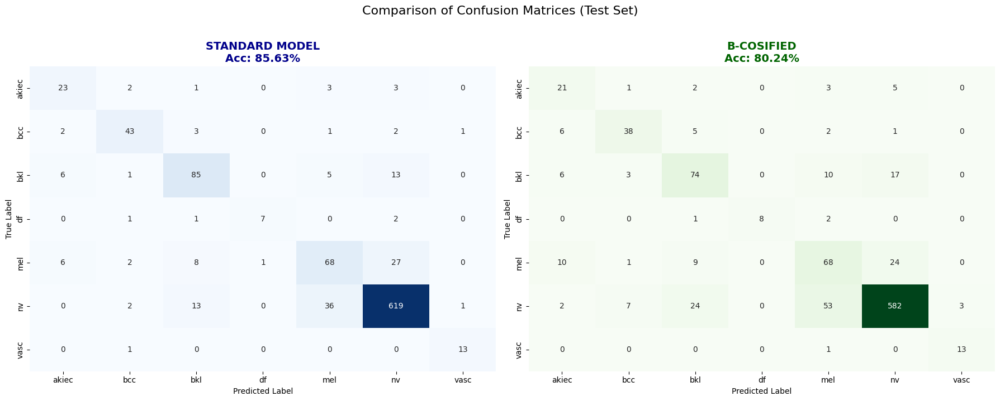


Comparative Metrics Table (Test Phase):


,Accuracy,Sensitivity (Recall),Specificity,PPV (Precision),NPV,F1-Score (Macro),MAP,Mean AUC (OvR)
Model,,,,,,,,
Standard,85.63%,77.33%,96.45%,78.39%,96.34%,77.52%,86.20%,96.62%
B-cos,80.24%,74.14%,95.60%,72.82%,94.85%,72.78%,76.15%,95.26%


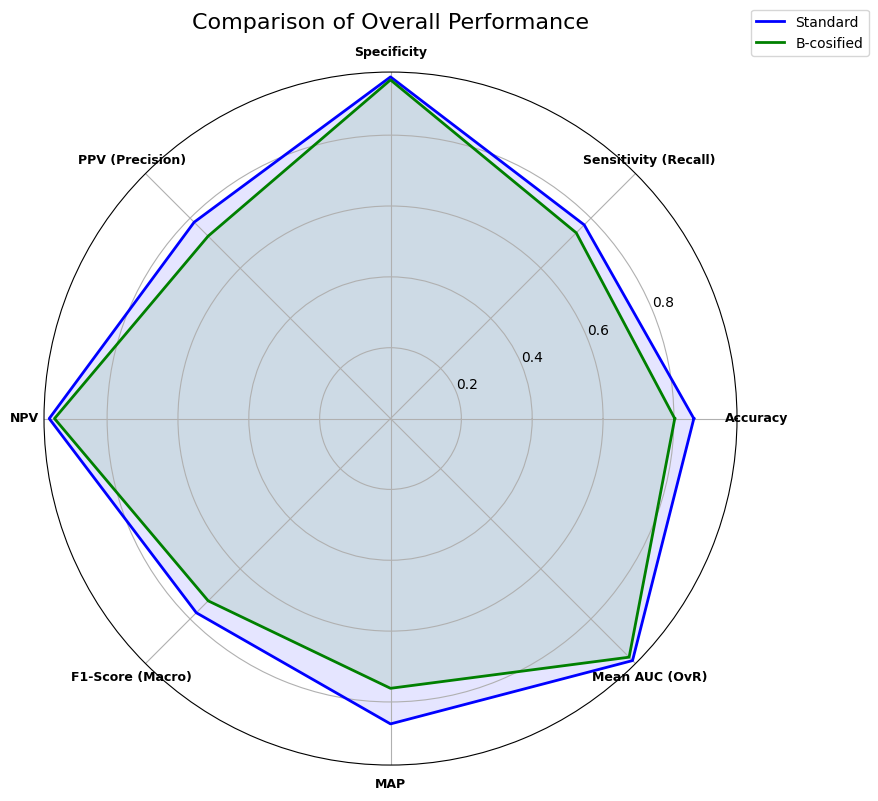


 PROBABILISTIC ANALYSIS (Advanced - Corrected Mapping)
--- Standard Binary Analysis ---
AUC Malignant vs Benign: 0.9427
AUC80 (High Sensitivity region): 0.8926
--- B-cos Binary Analysis ---
AUC Malignant vs Benign: 0.9215
AUC80 (High Sensitivity region): 0.8331


In [9]:
# =============================================================================
# 8. RUN FULL EVALUATION
# =============================================================================

print("1/2 Analyzing Standard Model (Test Set)...")
y_true_std, y_pred_std, y_prob_std = get_preds_and_probs(model_std, test_ds_std, device=device)

print("2/2 Analyzing B-Cosified Model (Test Set)...")
y_true_bcos, y_pred_bcos, y_prob_bcos = get_preds_and_probs(model_bcos, test_ds_bcos, device=device)

# Get correct class names sorted alphabetically
class_names = sorted(test_df['dx'].unique()) 

print("\n Generating Confusion Matrices...")
plot_comparison_matrices(y_true_std, y_pred_std, y_true_bcos, y_pred_bcos, class_names)

# Compute Metrics
metrics_std = compute_metrics_dict_advanced(y_true_std, y_pred_std, y_prob_std, "Standard", class_names)
metrics_bcos = compute_metrics_dict_advanced(y_true_bcos, y_pred_bcos, y_prob_bcos, "B-cos", class_names)

# Create Results DataFrame
results_df = pd.DataFrame([metrics_std, metrics_bcos]).set_index("Model")
pd.options.display.float_format = '{:.2%}'.format

print("\nComparative Metrics Table (Test Phase):")
display(results_df)

# =============================================================================
# RADAR CHART
# =============================================================================
categories = results_df.columns.tolist()
values_std = results_df.loc['Standard', categories].values.tolist()
values_bcos = results_df.loc['B-cos', categories].values.tolist()

values_std += values_std[:1]
values_bcos += values_bcos[:1]
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))

# Plot Standard
ax.plot(angles, values_std, linewidth=2, linestyle='solid', label='Standard', color='blue')
ax.fill(angles, values_std, 'blue', alpha=0.1)

# Plot B-cos
ax.plot(angles, values_bcos, linewidth=2, linestyle='solid', label='B-cosified', color='green')
ax.fill(angles, values_bcos, 'green', alpha=0.1)

# Labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=9, fontweight='bold')
plt.title("Comparison of Overall Performance", size=16, y=1.05)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.show()

# =============================================================================
# BINARY ANALYSIS (Malignant vs Benign)
# =============================================================================

# Correct mapping based on alphabetical order: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
# Malignant: akiec(0), bcc(1), mel(4)
# Benign: bkl(2), df(3), nv(5), vasc(6)

malignant_idxs = [0, 1, 4]
benign_idxs = [2, 3, 5, 6]

print("\n PROBABILISTIC ANALYSIS")
bin_auc_std, auc80_std = get_binary_analysis(y_true_std, y_prob_std, "Standard")
bin_auc_bcos, auc80_bcos = get_binary_analysis(y_true_bcos, y_prob_bcos, "B-cos")

## **Qualitative Analysis: Visual Explanations**

Beyond numerical metrics, the visual quality of explanations reveals the fundamental difference between the two approaches.

#### **A. Standard Model (Grad-CAM): The "Where"**
* **Blob-like Heatmaps:** As seen in the visualizations, Grad-CAM produces coarse, low-resolution "blobs" that cover the center of the lesion.
* **Localization vs. Explanation:** It answers the question **"WHERE is the model looking?"** but fails to explain **"WHAT features are important?"**.
* **Limitation:** It is often unclear if the model is looking at the lesion's irregular texture or simply firing because there is a dark spot in the center of the image.

#### **B. B-cos Model (Intrinsic): The "What"**
* **Segmentation-like Precision:** The B-cos explanations do not look like vague heatmaps but rather like **feature segmentation maps**.
* **Morphological Focus:**
    * **Borders & Edges:** Unlike Grad-CAM, the B-cos model clearly highlights the **boundaries** of the lesion. In dermatology, irregular borders are a key predictor of malignancy (ABCD rule), making this behavior clinically validated.
    * **Texture & Structure:** It distinguishes specific dermatoscopic structures (e.g., pigment networks, globules, or vascular patterns) rather than washing over the whole area.
* **Trust:** By highlighting specific pixels (e.g., the jagged edge of a melanoma or the vascular dots of an angioma), the model provides a verifiable reason for its decision, allowing the dermatologist to validate the diagnosis.

Searching for 1 image for each of the 7 classes in the Test Set...
 Starting Comparison on 7 images...


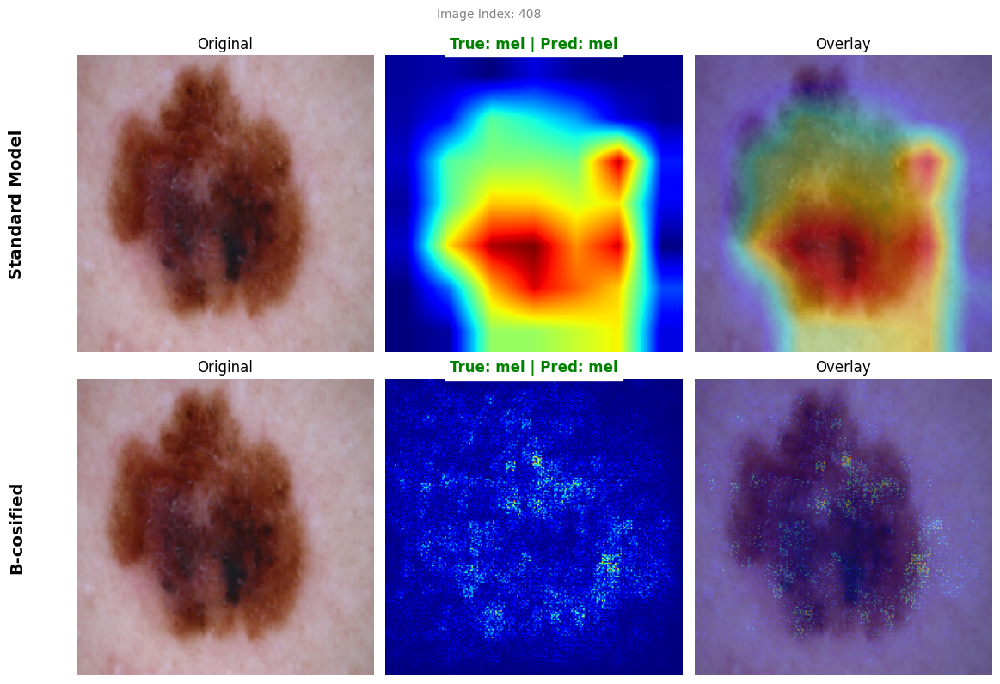

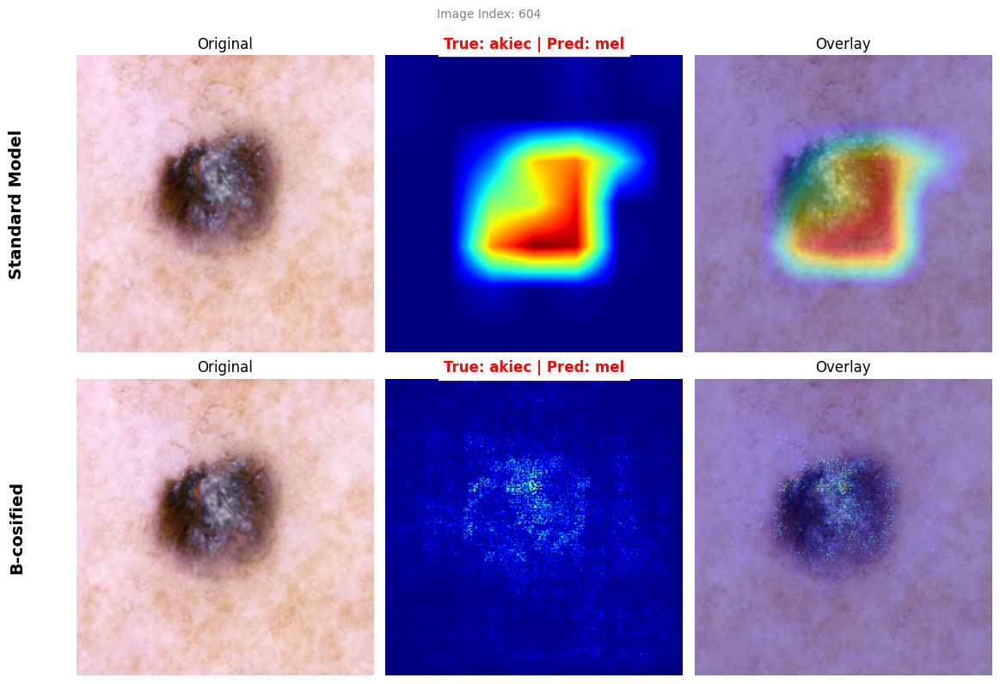

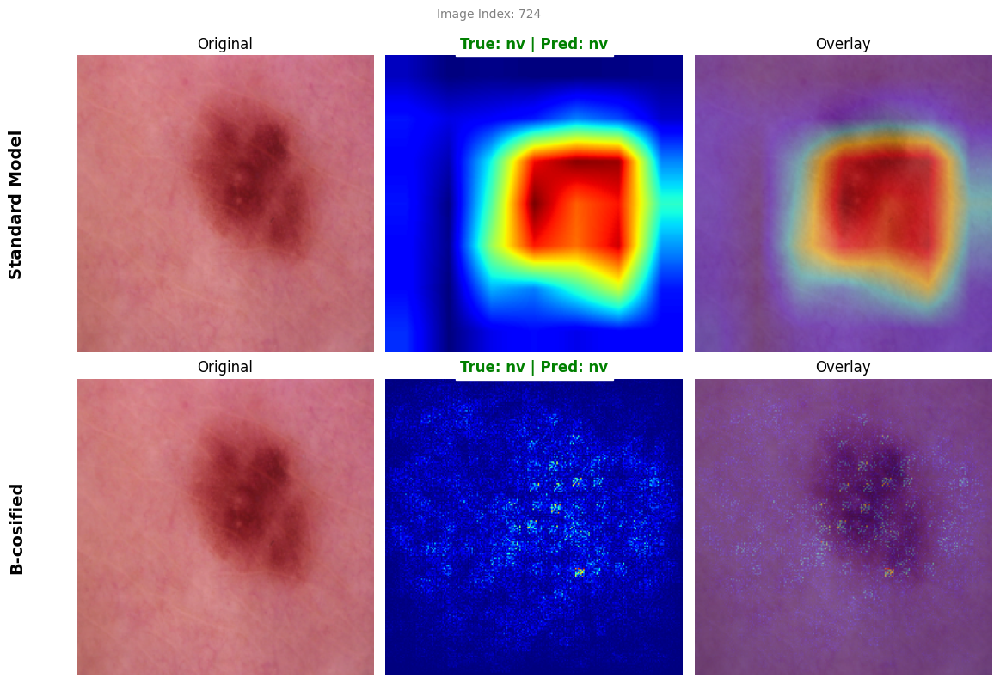

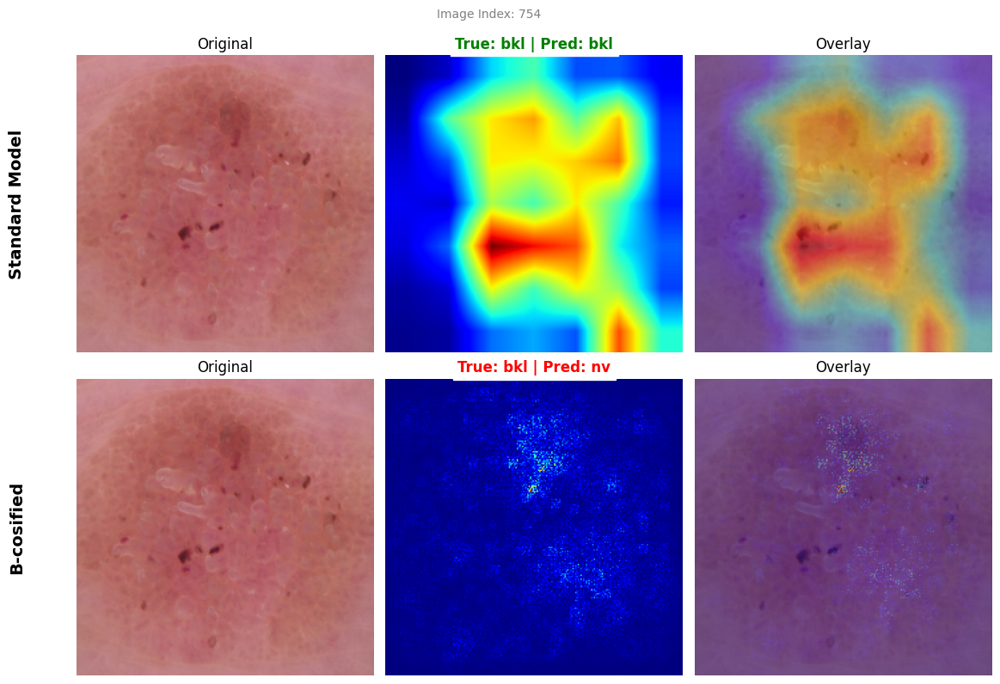

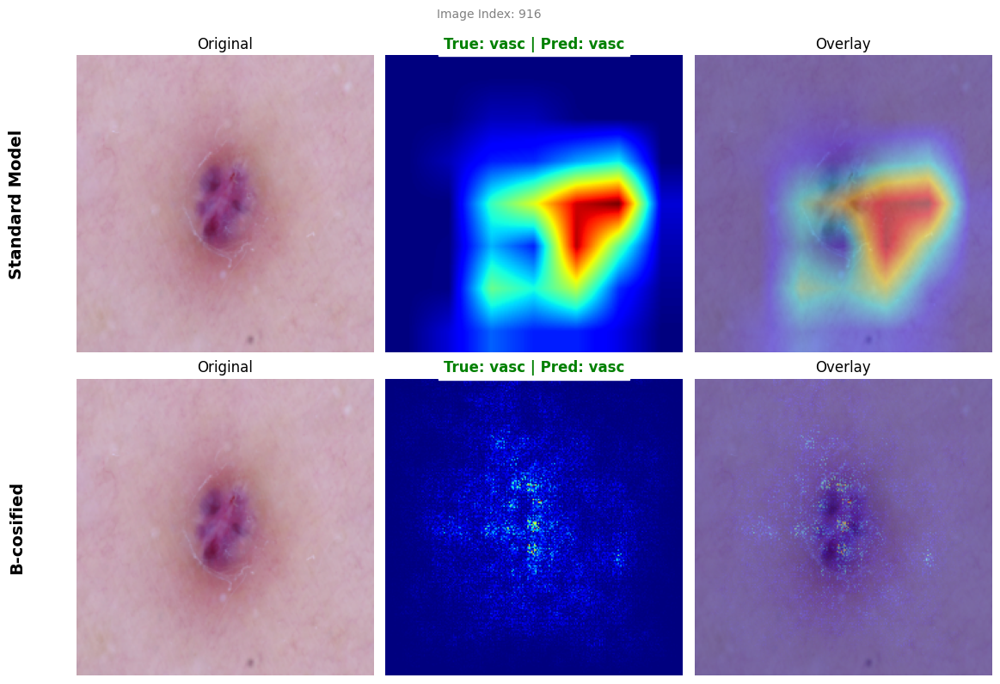

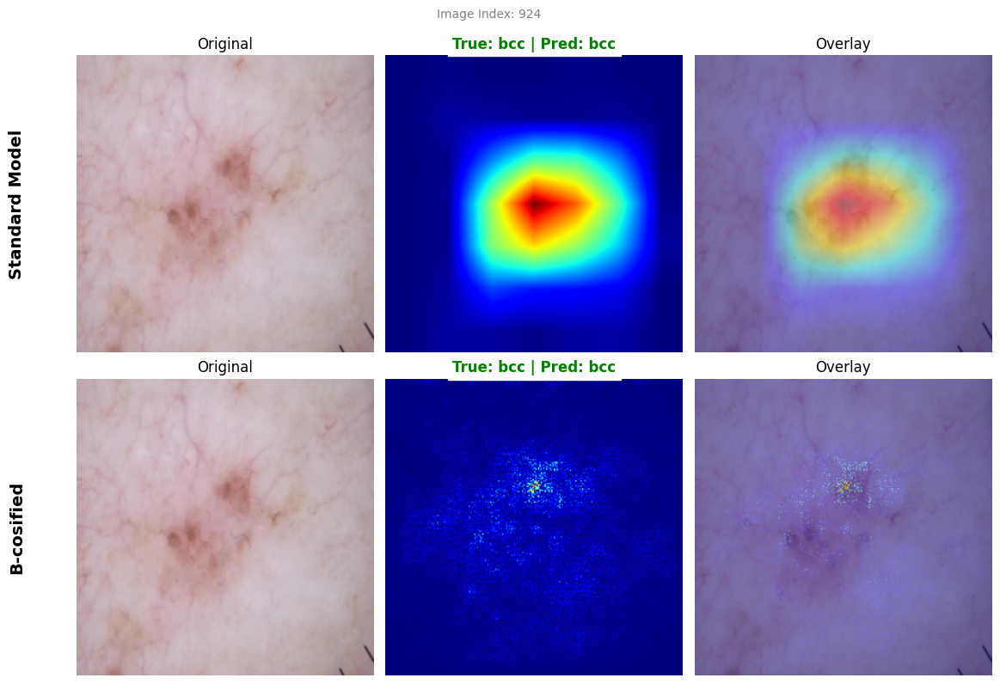

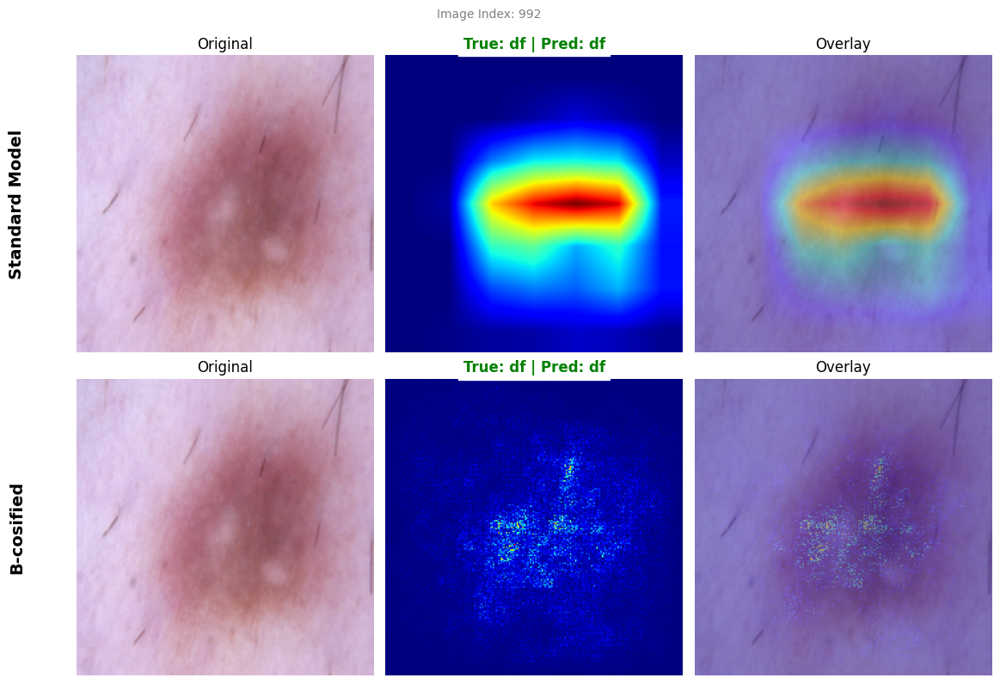

In [15]:
# =============================================================================
# 9. HEATMAP GENERATION & COMPARISON
# =============================================================================

# =============================================================================
# FUNCTION DEFINITIONS
# =============================================================================

class GradCAM:
    """Helper class for the Standard Model"""
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        self.handle_f = target_layer.register_forward_hook(self.save_activation)
        self.handle_b = target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def remove_hooks(self):
        self.handle_f.remove()
        self.handle_b.remove()

    def __call__(self, x):
        output = self.model(x)
        class_idx = output.argmax(dim=1).item()
        
        self.model.zero_grad()
        score = output[:, class_idx]
        score.backward()
        
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(x.shape[2], x.shape[3]), mode='bilinear', align_corners=False)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-7)
        
        return cam.squeeze().detach().cpu().numpy(), class_idx

def Explanation(model, mode, image_data, device='cuda', axes=None):
    """
    Performs the explanation and returns the predicted class index.
    """
    img_tensor, true_label = image_data
    if len(img_tensor.shape) == 3:
        img_tensor = img_tensor.unsqueeze(0)
    
    img_tensor = img_tensor.to(device).requires_grad_()
    
    heatmap = None
    pred_idx = None
    img_disp = None
    
    # --- STANDARD LOGIC (Grad-CAM) ---
    if mode == 'standard':
        target_layer = model.layer4[-1]
        grad_cam = GradCAM(model, target_layer)
        heatmap, pred_idx = grad_cam(img_tensor)
        grad_cam.remove_hooks()
        
        # ImageNet Denormalization
        inv_norm = transforms.Normalize(
            mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
            std=[1/0.229, 1/0.224, 1/0.225]
        )
        img_disp = inv_norm(img_tensor[0]).detach().cpu()

    # --- B-COS LOGIC (Input * Gradient) ---
    elif mode == 'bcos':
        output = model(img_tensor)
        pred_idx = output.argmax(dim=1).item()
        
        model.zero_grad()
        score = output[:, pred_idx]
        score.backward()
        
        # Explainability B-cos: Input * Gradient
        gradients = img_tensor.grad
        explanation = (img_tensor * gradients).sum(dim=1, keepdim=True).abs()
        
        explanation = explanation - explanation.min()
        explanation = explanation / (explanation.max() + 1e-7)
        heatmap = explanation.squeeze().detach().cpu().numpy()
        
        img_disp = img_tensor[0, :3, :, :].detach().cpu()

    # Overlay Preparation
    img_disp = img_disp.permute(1, 2, 0).numpy()
    img_disp = np.clip(img_disp, 0, 1)
    
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
    
    if heatmap_colored.shape[:2] != img_disp.shape[:2]:
        heatmap_colored = cv2.resize(heatmap_colored, (img_disp.shape[1], img_disp.shape[0]))
        
    overlay = heatmap_colored * 0.4 + img_disp * 0.6
    
    # Basic Visualization
    if axes is None:
        fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    else:
        ax = axes
        
    ax[0].imshow(img_disp); ax[0].set_title("Original"); ax[0].axis('off')
    ax[1].imshow(heatmap, cmap='jet'); ax[1].set_title(f"Heatmap"); ax[1].axis('off')
    ax[2].imshow(overlay); ax[2].set_title("Overlay"); ax[2].axis('off')
    
    if axes is None:
        plt.suptitle(f"Mode: {mode} | True: {true_label} | Pred: {pred_idx}")
        plt.show()
        
    return pred_idx

def Compare_models(model1, model2, indices, device='cuda'):
    """
    Main comparison function with side-by-side True vs Pred visualization.
    """
    print(f" Starting Comparison on {len(indices)} images...")
    
    for idx in indices:
        img_std, label_std = test_ds_std[idx]
        img_bcos, label_bcos = test_ds_bcos[idx]
        
        # --- INDEX TO CLASS NAME CONVERSION ---
        true_name = class_names[label_std] # Real class name (e.g., 'nv', 'mel')
        
        fig, axes = plt.subplots(2, 3, figsize=(12, 8))
        
        # --- ROW 1: STANDARD ---
        pred_idx_std = Explanation(model1, 'standard', (img_std, label_std), device, axes[0])
        pred_name_std = class_names[pred_idx_std] # Predicted class name
        
        # Side label (Standard Model)
        axes[0, 0].text(-0.2, 0.5, "Standard Model", fontsize=14, fontweight='bold', 
                        rotation=90, va='center', ha='center', transform=axes[0, 0].transAxes)
        
        # CENTRAL TITLE WITH NAMES
        color_std = 'green' if pred_idx_std == label_std else 'red'
        axes[0, 1].set_title(f"True: {true_name} | Pred: {pred_name_std}", 
                             fontsize=12, fontweight='bold', color=color_std, backgroundcolor='white')
        
        
        # --- ROW 2: B-COS ---
        pred_idx_bcos = Explanation(model2, 'bcos', (img_bcos, label_bcos), device, axes[1])
        pred_name_bcos = class_names[pred_idx_bcos] # Predicted class name
        
        # Side label (B-cos Model)
        axes[1, 0].text(-0.2, 0.5, "B-cosified", fontsize=14, fontweight='bold', 
                        rotation=90, va='center', ha='center', transform=axes[1, 0].transAxes)
        
        # CENTRAL TITLE WITH NAMES
        color_bcos = 'green' if pred_idx_bcos == label_bcos else 'red'
        axes[1, 1].set_title(f"True: {true_name} | Pred: {pred_name_bcos}", 
                             fontsize=12, fontweight='bold', color=color_bcos, backgroundcolor='white')
        
        # Global Title
        plt.suptitle(f"Image Index: {idx}", fontsize=10, y=0.99, color='gray')
        
        plt.tight_layout()
        plt.subplots_adjust(left=0.1) # Space for side labels
        plt.show()

# =============================================================================
# FINAL EXECUTION
# =============================================================================

idxs = []
print(f"Searching for 1 image for each of the {NUM_CLASSES} classes in the Test Set...")

# Loop through each class (0 to 6)
for class_id in range(NUM_CLASSES):
    indices_of_class = np.where(test_df['label_idx'].values == class_id)[0]
    
    if len(indices_of_class) > 0:
        selected_idx = np.random.choice(indices_of_class)
        idxs.append(selected_idx)

idxs.sort()

# Run comparison
Compare_models(model_std, model_bcos, idxs, device=device)

## **Critical Error Analysis: False Negatives**

From a clinical perspective, the most dangerous error is a **False Negative**: failing to identify a malignant lesion (`mel`, `bcc`, `akiec`).

In this section, we filter the results to display only cases where the **Ground Truth was Malignant** but the model predicted otherwise.

* **Top Row (True Class):** Shows the features of the malignant class that the model *should* have picked up.
* **Bottom Row (Predicted Class):** Shows the features that convinced the model the lesion was a different class.

This visualization helps us understand if the model is missing specific "danger signs".

 Visualizing 3 critical False Negatives...


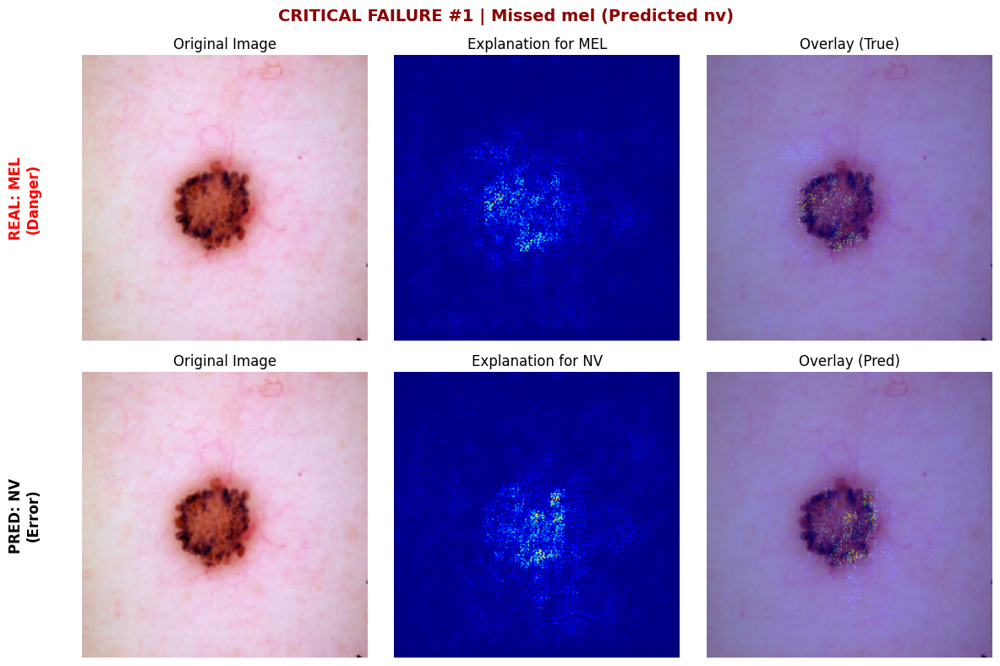

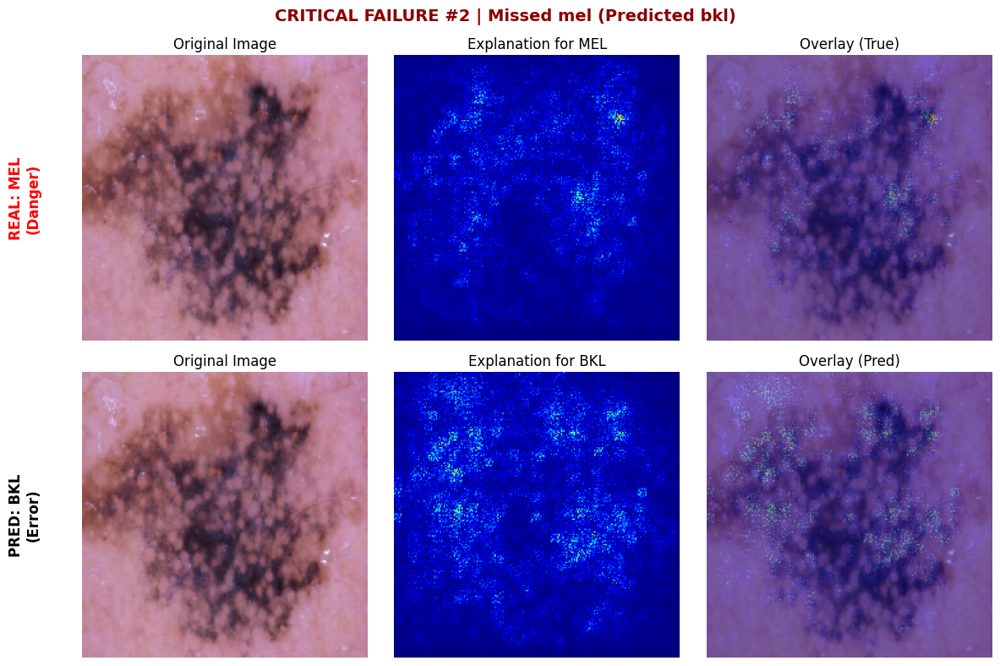

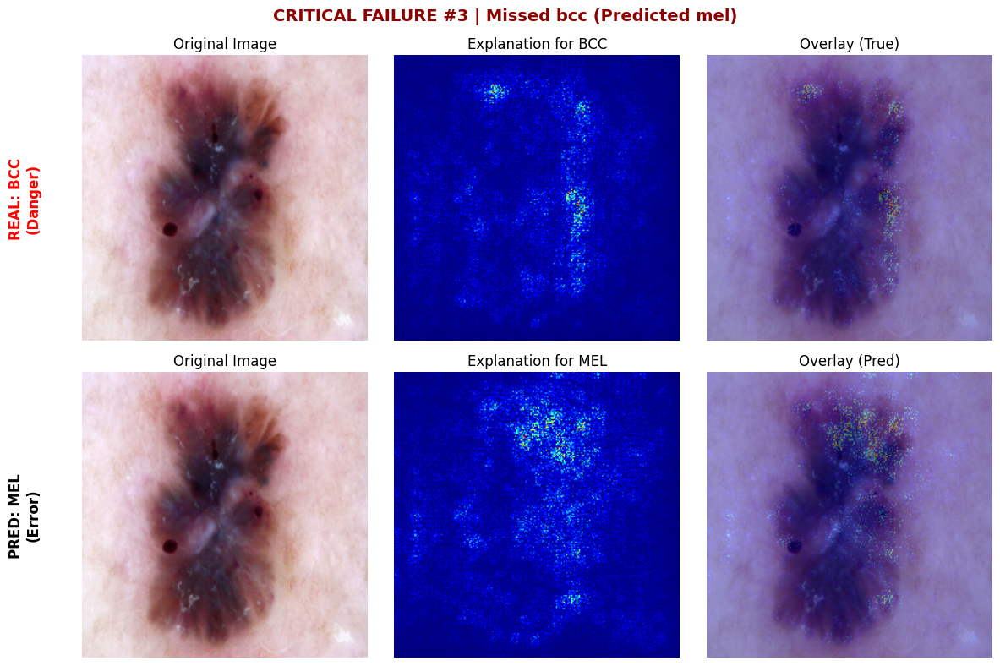

In [18]:
# =============================================================================
# 10. ERROR ANALYSIS: FALSE NEGATIVES (MISSED MALIGNANCIES)
# =============================================================================
def get_bcos_specific_explanation(model, img_tensor, target_class_idx):
    """Computete the heatmap for a specific class."""
    img_tensor = img_tensor.clone().detach().requires_grad_(True)
    output = model(img_tensor)
    model.zero_grad()
    
    score = output[:, target_class_idx]
    score.backward()
    
    gradients = img_tensor.grad
    explanation = (img_tensor * gradients).sum(dim=1, keepdim=True).abs()
    
    explanation = explanation - explanation.min()
    explanation = explanation / (explanation.max() + 1e-7)
    return explanation.squeeze().detach().cpu().numpy()


def Analyze_Malignant_Errors(model, dataset, num_examples=3, device='cuda'):
    # Define malignant class indices (based on alphabetical order)
    # 0: akiec, 1: bcc, 4: mel
    malignant_idxs = [0, 1, 4] 
    
    error_indices = []
    
    all_idxs = np.arange(len(dataset))
    np.random.shuffle(all_idxs)
    
    for idx in all_idxs:
        img, label = dataset[idx]
        
        if label in malignant_idxs:
            img_tensor = img.unsqueeze(0).to(device)
            
            with torch.no_grad():
                output = model(img_tensor)
                pred_idx = output.argmax(dim=1).item()
            
            # If the model prediction is wrong
            if pred_idx != label:
                error_indices.append((idx, label, pred_idx))
                
            if len(error_indices) >= num_examples:
                break
            
    if len(error_indices) == 0:
        print(" Excellent! No errors found on the tested malignant samples.")
        return

    print(f" Visualizing {len(error_indices)} critical False Negatives...")

    for i, (idx, true_idx, pred_idx) in enumerate(error_indices):
        img, _ = dataset[idx]
        img_tensor = img.unsqueeze(0).to(device)
        
        # --- 1. Compute Heatmaps ---
        hm_true = get_bcos_specific_explanation(model, img_tensor, true_idx)
        hm_pred = get_bcos_specific_explanation(model, img_tensor, pred_idx)
        
        # --- 2. Prepare Images ---
        img_disp = img_tensor[0, :3, :, :].detach().cpu().permute(1, 2, 0).numpy()
        img_disp = np.clip(img_disp, 0, 1)

        def create_overlay(hm):
            hm_c = cv2.applyColorMap(np.uint8(255 * hm), cv2.COLORMAP_JET)
            hm_c = cv2.cvtColor(hm_c, cv2.COLOR_BGR2RGB) / 255.0
            if hm_c.shape[:2] != img_disp.shape[:2]:
                hm_c = cv2.resize(hm_c, (img_disp.shape[1], img_disp.shape[0]))
            return hm_c * 0.4 + img_disp * 0.6

        ov_true = create_overlay(hm_true)
        ov_pred = create_overlay(hm_pred)
        
        # --- 3. PLOTTING ---
        fig, axes = plt.subplots(2, 3, figsize=(12, 8))
        
        name_true = class_names[true_idx]
        name_pred = class_names[pred_idx]

        # ROW 1: EVIDENCE FOR TRUE (MALIGNANT)
        axes[0, 0].imshow(img_disp); axes[0, 0].set_title("Original Image"); axes[0, 0].axis('off')
        axes[0, 1].imshow(hm_true, cmap='jet'); axes[0, 1].set_title(f"Explanation for {name_true.upper()}"); axes[0, 1].axis('off')
        axes[0, 2].imshow(ov_true); axes[0, 2].set_title("Overlay (True)"); axes[0, 2].axis('off')
        
        axes[0, 0].text(-0.2, 0.5, f"REAL: {name_true.upper()}\n(Danger)", fontsize=12, fontweight='bold', color='red',
                        rotation=90, va='center', ha='center', transform=axes[0, 0].transAxes)

        # ROW 2: EVIDENCE FOR PRED (WRONG)
        axes[1, 0].imshow(img_disp); axes[1, 0].set_title("Original Image"); axes[1, 0].axis('off')
        axes[1, 1].imshow(hm_pred, cmap='jet'); axes[1, 1].set_title(f"Explanation for {name_pred.upper()}"); axes[1, 1].axis('off')
        axes[1, 2].imshow(ov_pred); axes[1, 2].set_title("Overlay (Pred)"); axes[1, 2].axis('off')

        axes[1, 0].text(-0.2, 0.5, f"PRED: {name_pred.upper()}\n(Error)", fontsize=12, fontweight='bold', color='black',
                        rotation=90, va='center', ha='center', transform=axes[1, 0].transAxes)

        plt.suptitle(f"CRITICAL FAILURE #{i+1} | Missed {name_true} (Predicted {name_pred})", fontsize=14, y=0.98, fontweight='bold', color='darkred')
        plt.subplots_adjust(left=0.1)
        plt.tight_layout()
        plt.show()

# EXECUTION
Analyze_Malignant_Errors(model_bcos, test_ds_bcos, num_examples=3, device=device)